# Supporting EDA Material

## [Tidy Tuesday Spotify Dataset](https://github.com/rfordatascience/tidytuesday/tree/main/data/2020/2020-01-21)

Author: [Ashley Kennedy](ashley.g.kennedy@gmail.com)

## Import Modules and Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

In [3]:
spotify = pd.read_csv(songs_url)

In [4]:
spotify = pd.read_csv(songs_url)

## Basic Information

### Number of Rows and Columns

In [5]:
spotify.shape

(32833, 23)

### Column names and data types

In [6]:
spotify.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

### Number of missing values per variable

In [7]:
spotify.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

### Number of unique values per variable

In [8]:
spotify.nunique()

track_id                    28356
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22545
track_album_name            19743
track_album_release_date     4530
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17684
duration_ms                 19785
dtype: int64

## Clean the Data

In [9]:
spotify_copy = spotify.dropna().copy()

The column `track_album_release_date` has an `object` data type. However, I will change this to have a `datetime` data type and add additional columns to represent the release year and release month of a song.

In [10]:
spotify_copy['track_album_release_date'] = pd.to_datetime(spotify_copy.track_album_release_date, format='mixed')

In [11]:
spotify_copy['release_month'] = spotify_copy.track_album_release_date.dt.month

spotify_copy['release_year'] = spotify_copy.track_album_release_date.dt.year

In [12]:
spotify_copy.loc[ :, ['track_album_release_date', 'release_month', 'release_year'] ].head()

,track_album_release_date,release_month,release_year
0,2019-06-14,6,2019
1,2019-12-13,12,2019
2,2019-07-05,7,2019
3,2019-07-19,7,2019
4,2019-03-05,3,2019


I will also change `release_month` to be a categorical variable, as well as convert `release_year` into a binary variable with values "recent" and "older" based on if the `release_year` is less than 2010.

In [13]:
spotify_copy['release_month'] = spotify_copy.release_month.astype('category')

In [14]:
spotify_copy['bin_year'] = np.where( spotify_copy.release_year < 2010, 'older', 'recent')

In [15]:
spotify_copy.groupby(['track_id', 'track_album_id', 'playlist_id']).size().reset_index(name='num_rows').\
num_rows.value_counts()

num_rows
1    31714
2      482
3       50
Name: count, dtype: int64

We can see that there are over 500 rows that contain more than one combination of `track_id`, `track_album_id`, and `playlist_id`. Because of this, we will exclude these tracks from our analysis.

In [16]:
spotify_copy.drop_duplicates(['track_id', 'track_album_id', 'playlist_id'], inplace=True)

In [17]:
len(spotify) - len(spotify_copy)

587

Remove the unneeded columns.

In [18]:
spotify_copy.drop(
    columns=['track_id',
             'track_name',
             'track_album_id',
             'track_album_name',
             'track_album_release_date',
             'playlist_name',
             'playlist_id',
             'track_artist'],
    inplace=True
)

## Visualizations

### Counts of Categorical Variables

**`playlist_genre`**:

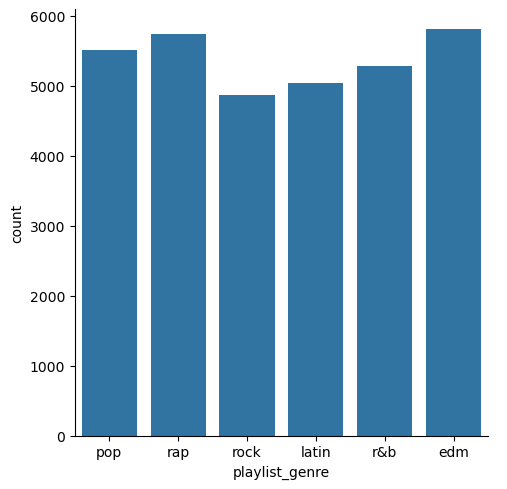

In [19]:
sns.catplot(data=spotify_copy, x='playlist_genre', kind='count')

plt.show()

**`playlist_subgenre`**:

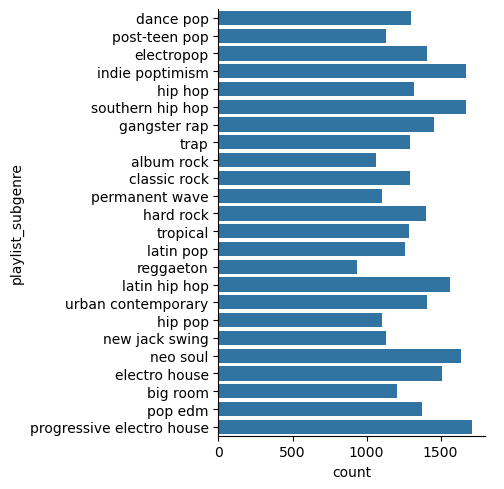

In [20]:
sns.catplot(data=spotify_copy, y='playlist_subgenre', kind='count')

plt.show()

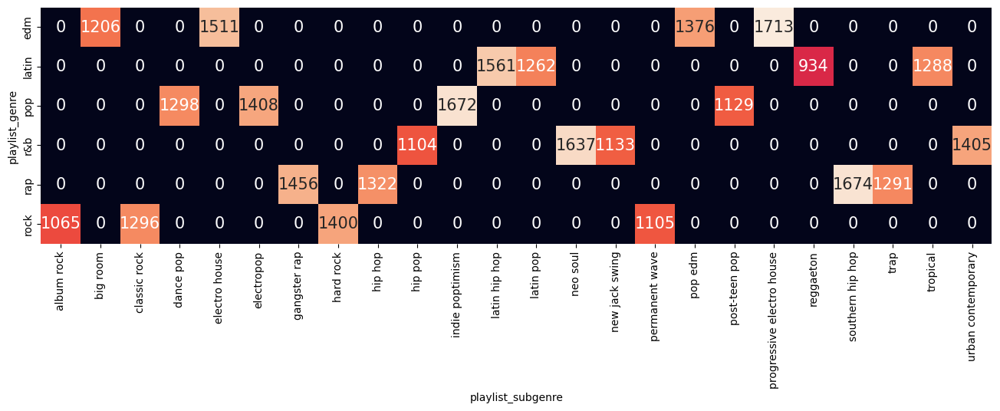

In [21]:
fig, ax = plt.subplots(figsize=(16,4))

sns.heatmap(pd.crosstab(spotify_copy.playlist_genre, spotify_copy.playlist_subgenre),
            annot=True, annot_kws={'fontsize': 15}, fmt='d',
            cbar=False)

plt.show()

**`mode`**:

`mode` indicates the modality of a track, with 1 representing major and 0 representing minor. To simplify this, I will change 0 to `minor` and 1 to `major` using the `.replace()` method.

In [22]:
spotify_copy['mode'] = spotify_copy['mode'].replace({0: 'minor', 1: 'major'})

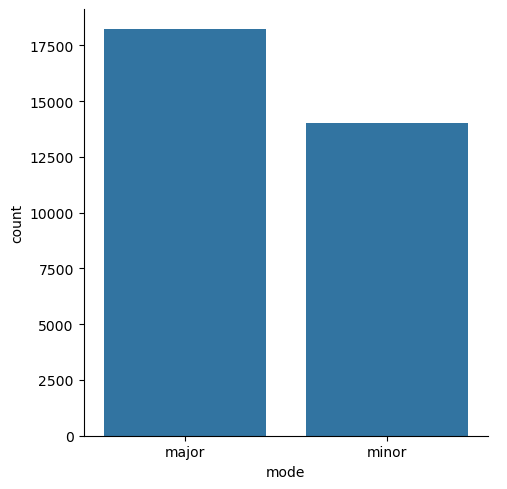

In [23]:
sns.catplot(data=spotify_copy, x='mode', kind='count')

plt.show()

**`key`**:

Just like `mode`, I will change the `key` column to update the integers to represent their actual pitch class.

In [24]:
spotify_copy['key'] = spotify_copy.key.replace({0: 'C', 1: 'C♯/D♭', 2: 'D', 3: 'D♯/E♭', 4: 'E', 5: 'F', 6: 'F♯/G♭', 7: 'G', 8: 'G♯/A♭', 9: 'A', 10: 'A♯/B♭', 11: 'B'})

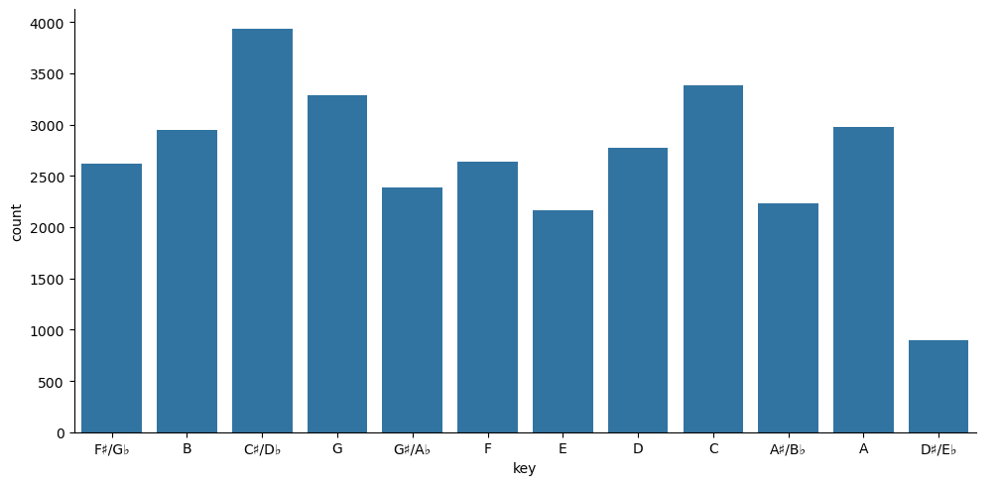

In [25]:
sns.catplot(data=spotify_copy, x='key', kind='count', aspect=2)

plt.show()

**`track_album_release_date`**:

After changing the data type of `track_album_release_date` to a `datetime` data type, we can now visualize this as a categorical variable.

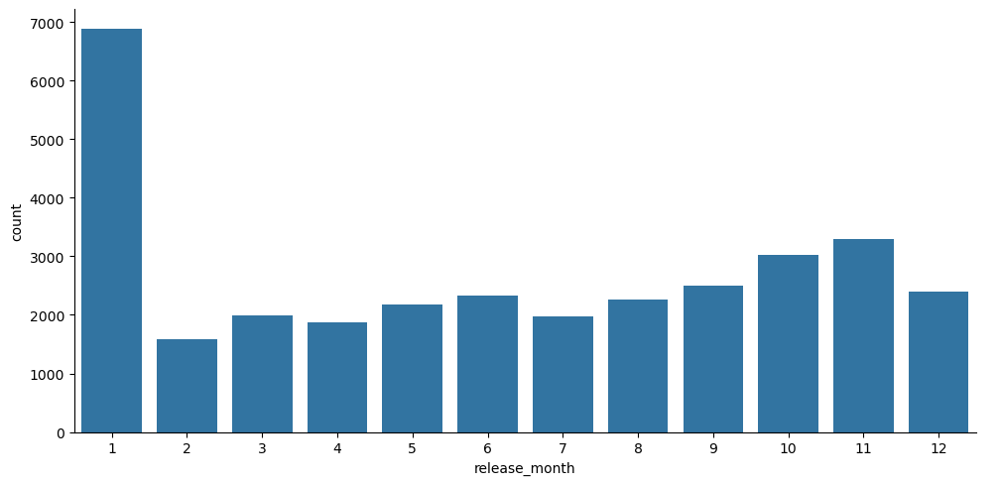

In [26]:
sns.catplot(data=spotify_copy, x='release_month', kind='count', aspect=2)

plt.show()

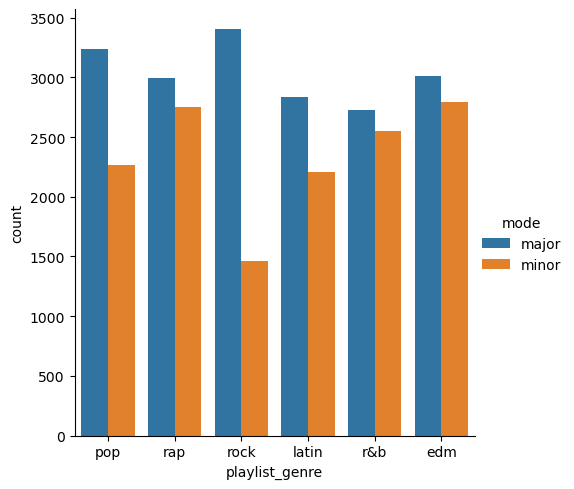

In [27]:
sns.catplot(data=spotify_copy, x='playlist_genre', hue='mode', kind='count')

plt.show()

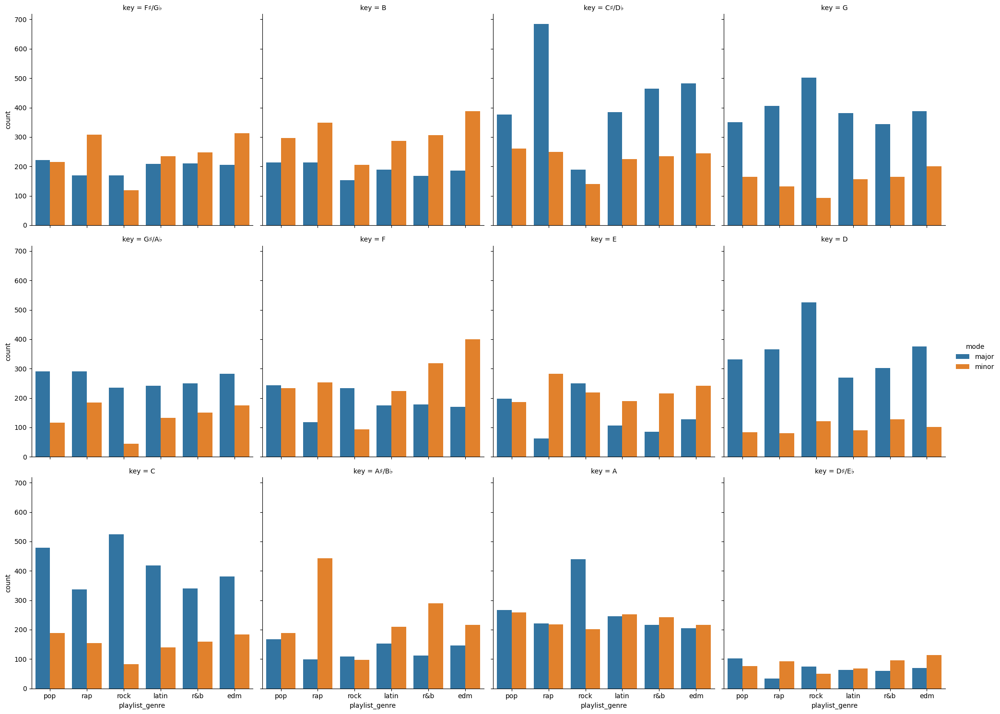

In [28]:
sns.catplot(data=spotify_copy, x='playlist_genre', hue='mode', col='key', col_wrap=4, kind='count')

plt.show()

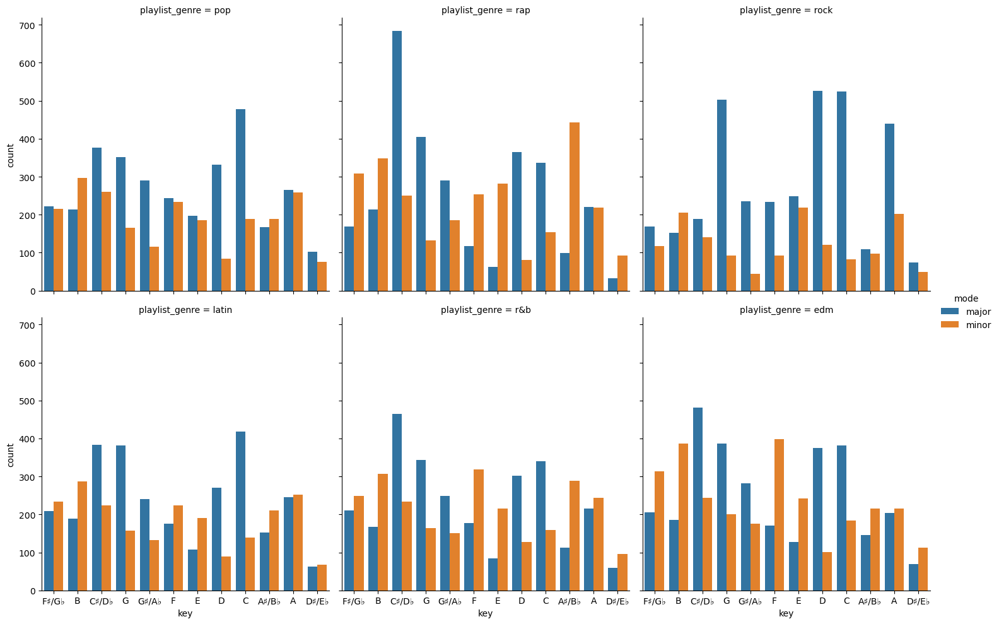

In [29]:
sns.catplot(data=spotify_copy, x='key', col='playlist_genre', hue='mode', kind='count', col_wrap=3)

plt.show()

### Distributions of Continuous Variables

I will convert the dataset to long format so that we can visualize all of the continuous variables together.

In [30]:
spotify_lf = spotify_copy.reset_index().\
    rename(columns={'index': 'rowid'}).\
    melt(id_vars=['rowid'] + spotify_copy.select_dtypes('object').columns.tolist(),
         value_vars=spotify_copy.select_dtypes('number').copy())

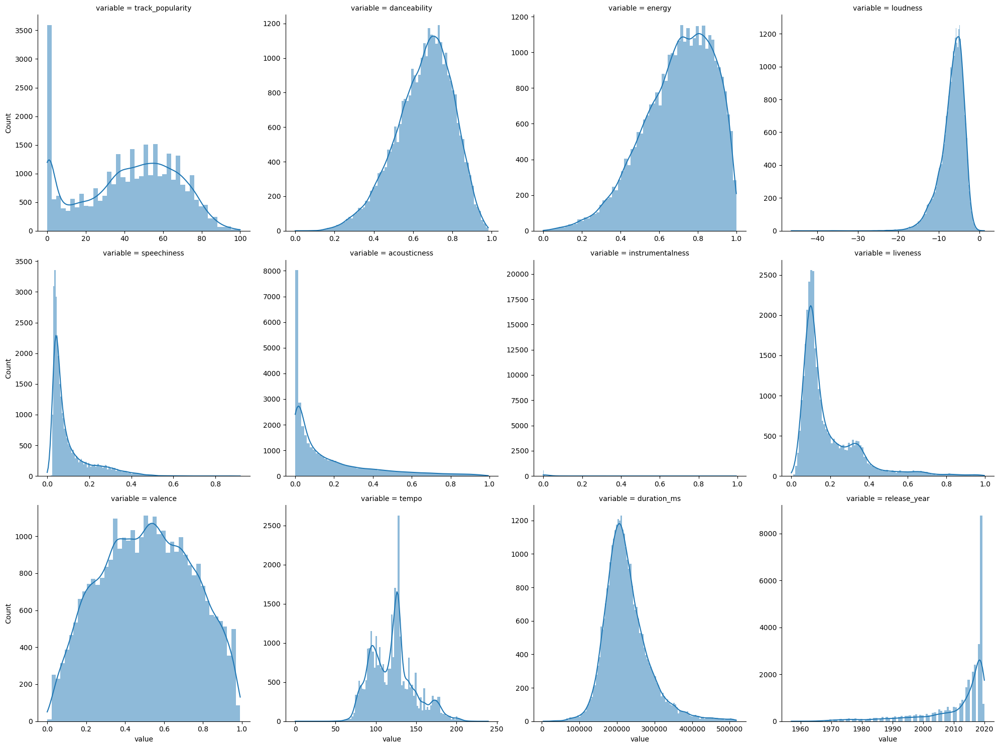

In [31]:
sns.displot(data=spotify_lf, x='value', col='variable', col_wrap=4,
            kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False)

plt.show()

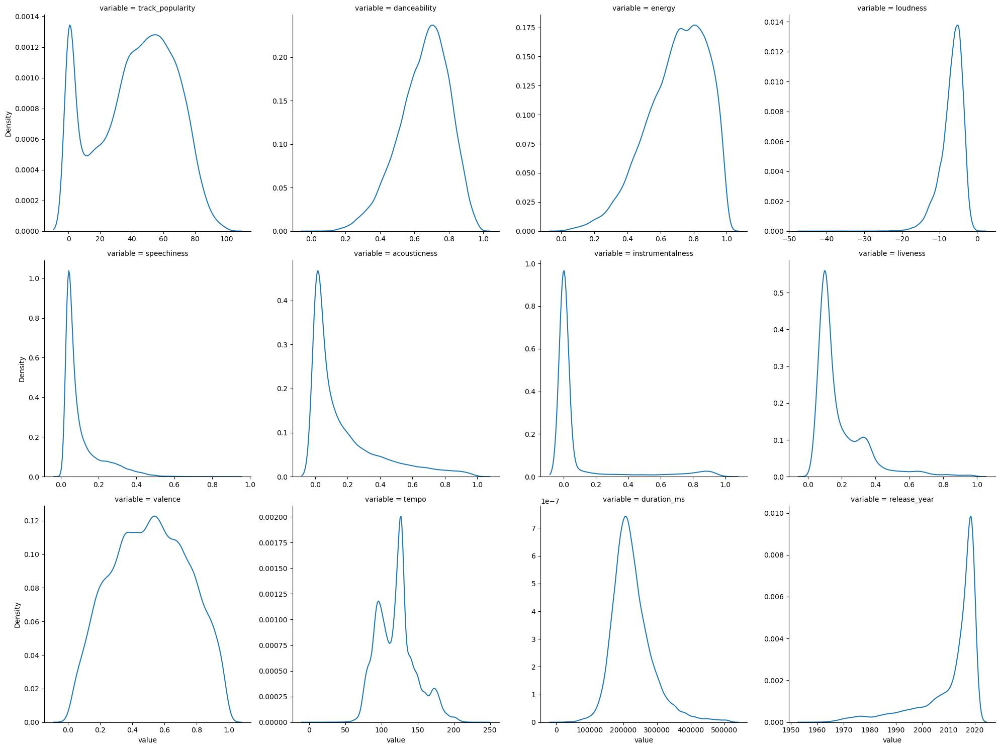

In [32]:
sns.displot(data=spotify_lf, x='value', col='variable', col_wrap=4,
            kind='kde',
            facet_kws={'sharex': False, 'sharey': False})

plt.show()

This visualization revealed a high density of values at and around 0 for the output variable `track_popularity` resulting in extreme skews for some of the audio features. Since I will be performing regression, I will apply some transformations the variables that do not appear to be Gaussian-like.

I will begin by applying the logit transformation to `track_popularity`.

In [33]:
spotify_copy['track_pop_shift'] = np.where( spotify_copy.track_popularity == 100, spotify_copy.track_popularity - 0.1, spotify_copy.track_popularity)

spotify_copy['track_pop_shift'] = np.where( spotify_copy.track_popularity == 0, spotify_copy.track_popularity + 0.1, spotify_copy.track_pop_shift )

In [34]:
spotify_copy['y'] = np.log(
    (spotify_copy.track_pop_shift / 100) / (1 - (spotify_copy.track_pop_shift / 100))
)

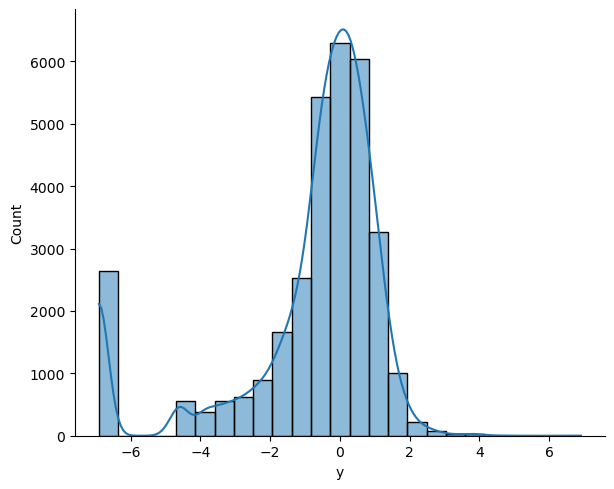

In [35]:
sns.displot(data = spotify_copy, x='y', kind='hist', kde=True, bins=25, aspect=1.25)

plt.show()

Now we can see that the distribution is mostly symmetric around 0 with a spike at `y < -6`.

I will now apply the appropriate transformation to `speechiness`.

In [36]:
spotify_copy['log_speechiness'] = np.log(spotify_copy.speechiness + 0.01)

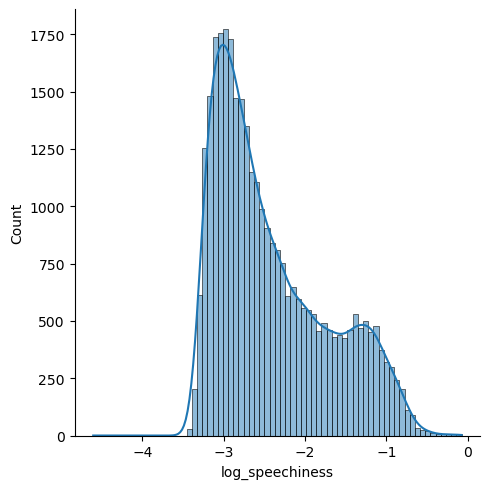

In [37]:
sns.displot(data=spotify_copy, x='log_speechiness', kind='hist', kde=True)

plt.show()

The log transformation of `speechiness` substantially reduced the original skew in `speechiness`, producing a distribution that is still right-skewed but far more symmetric and statistically manageable.”

I will now apply the logit transformation to `acousticness`.

In [38]:
spotify_copy['acoustic_shift'] = np.where( spotify_copy.acousticness == 1, spotify_copy.acousticness - 0.1, spotify_copy.acousticness)

spotify_copy['acoustic_shift'] = np.where( spotify_copy.acousticness == 0, spotify_copy.acousticness + 0.1, spotify_copy.acousticness )

In [39]:
spotify_copy['logit_acousticness'] = np.log(
    spotify_copy.acoustic_shift / (1 - (spotify_copy.acoustic_shift))
)

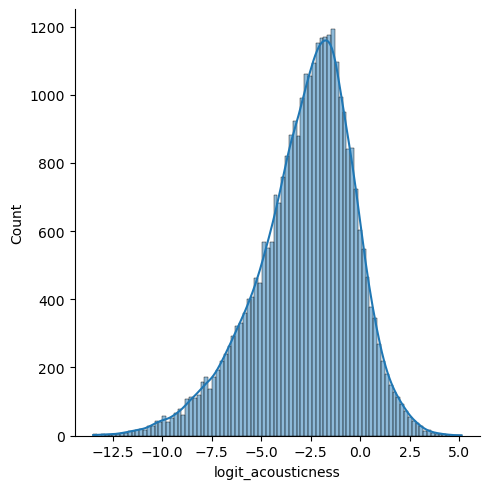

In [40]:
sns.displot(data=spotify_copy, x='logit_acousticness', kind='hist', kde=True)

plt.show()

The logit transformation did a great job at normalizing the curve for `acousticness`.

Let's apply a transformation to `liveness`. But this time, let's use the square root since the skew is not as extreme as the previous variables.

In [41]:
spotify_copy['sqrt_liveness'] = np.sqrt(spotify_copy.liveness + 0.01)

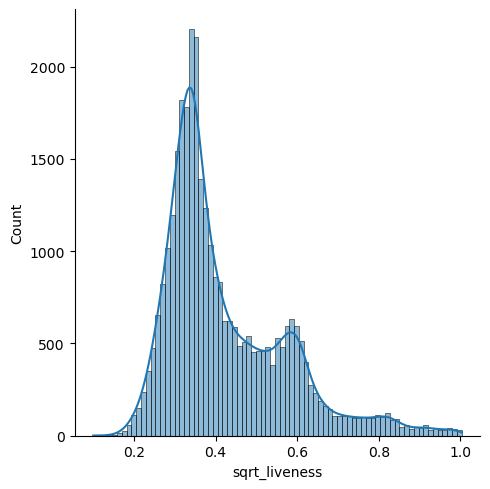

In [42]:
sns.displot(data=spotify_copy, x='sqrt_liveness', kind='hist', kde=True)

plt.show()

### Relationships Between Continuous Variables

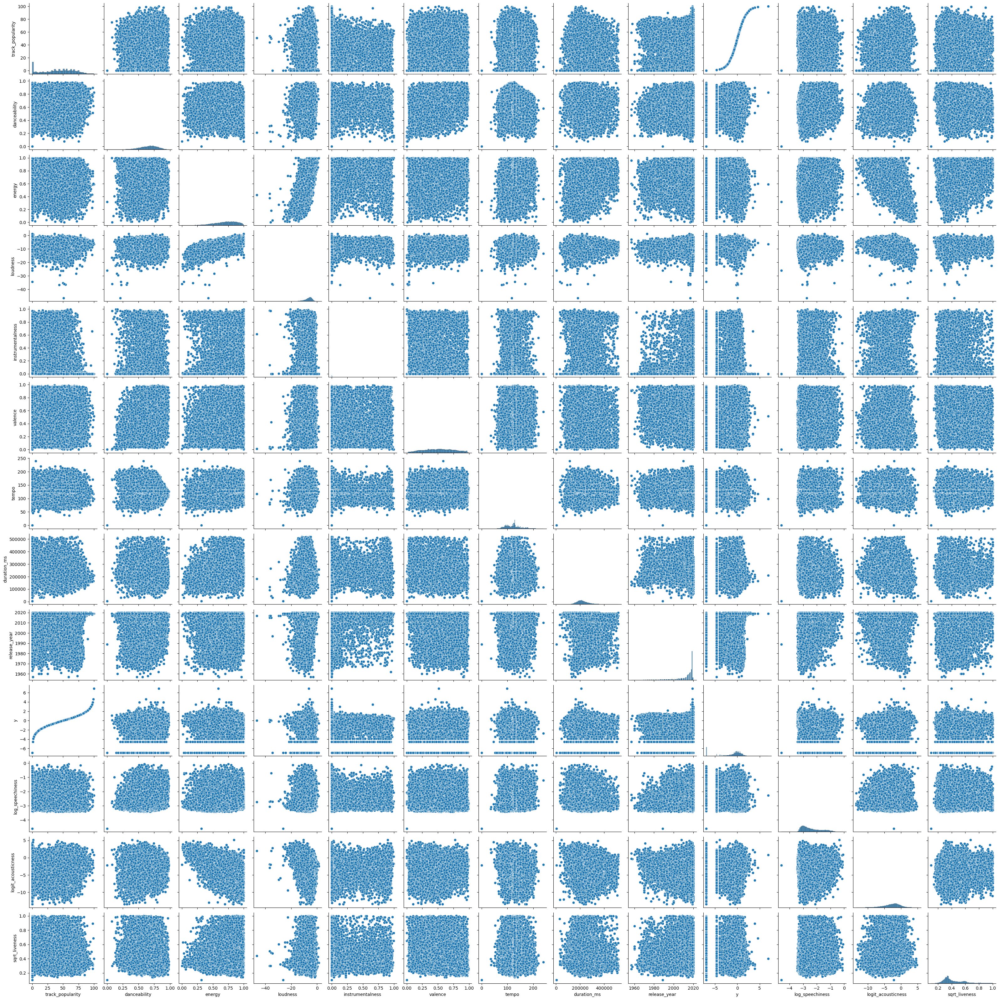

In [43]:
sns.pairplot(data=spotify_copy.drop(
    columns=['track_pop_shift', 'acoustic_shift', 'speechiness', 'acousticness', 'liveness']
))

plt.show()

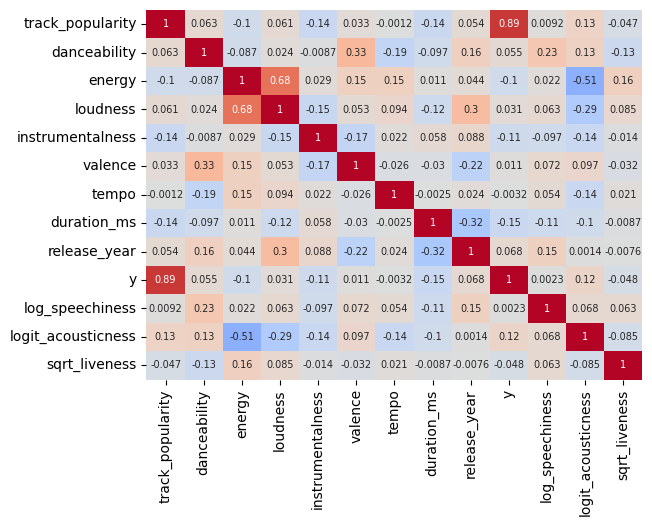

In [44]:
fig, ax = plt.subplots()

sns.heatmap(data=spotify_copy.drop(
    columns=['track_pop_shift', 'acoustic_shift', 'speechiness', 'acousticness', 'liveness']
).corr(numeric_only=True),
            vmin=-1, vmax=1, center=0,
            annot=True, annot_kws={'size': 7},
            cmap='coolwarm',
            cbar=None,
            ax=ax)

plt.show()

As we can see from the correlation heatmap, none of the continuous variables display a strong relationship to one another. `loudness` and `energy` have the highest correlation at 0.68 so I will visualize their relationship below.

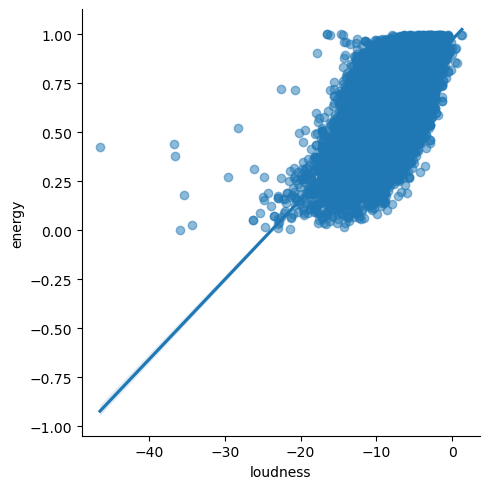

In [45]:
sns.lmplot(data=spotify_copy, x='loudness', y='energy', scatter_kws={'alpha': 0.5})

plt.show()

There also appear to be a moderate relationship between `energy` and `logit_acousticness`.

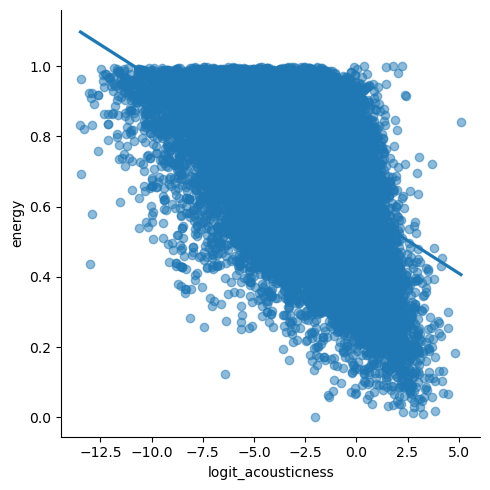

In [46]:
sns.lmplot(data=spotify_copy, x='logit_acousticness', y='energy', scatter_kws={'alpha': 0.5})

plt.show()

### Summaries of continuous variables grouped by categorical variables

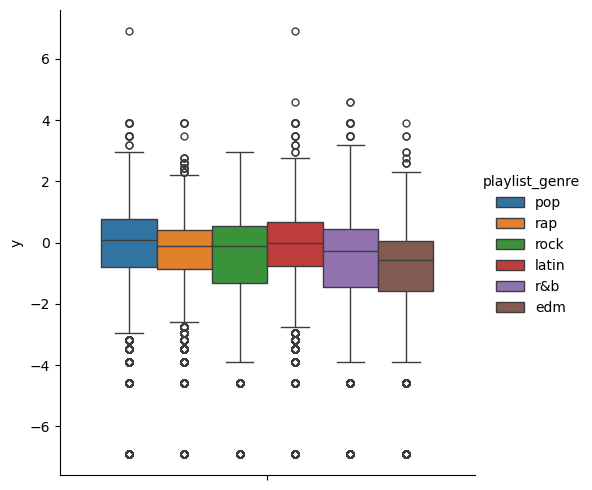

In [47]:
sns.catplot(data=spotify_copy, y='y', hue='playlist_genre', kind='box')

plt.show()

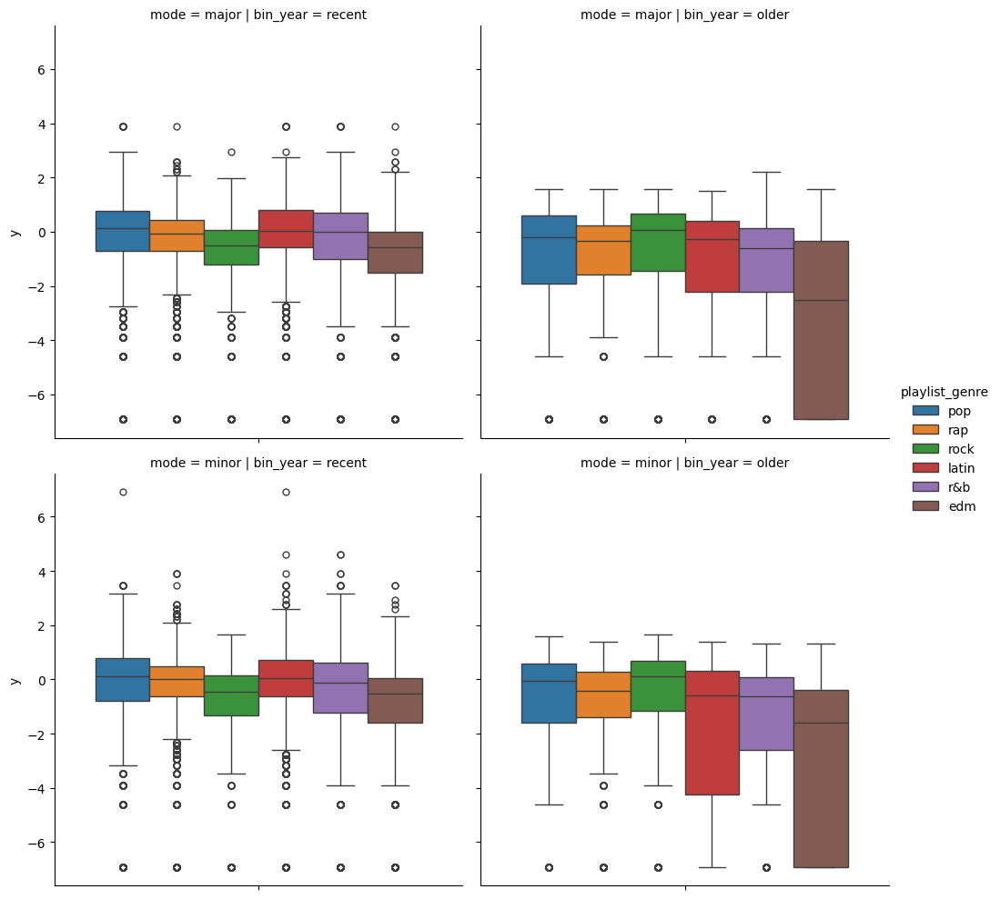

In [48]:
sns.catplot(data=spotify_copy, y='y', hue='playlist_genre', row='mode', col='bin_year', kind='box')

plt.show()

The boxplot above demonstrates how older edm songs tend to be less popular than other genres. Likewise, older latin songs in minor mode also have more variability on the lower end than onler latin songs in major mode.

However, all genres behave similarly regardless of mode if they are more recent releases.

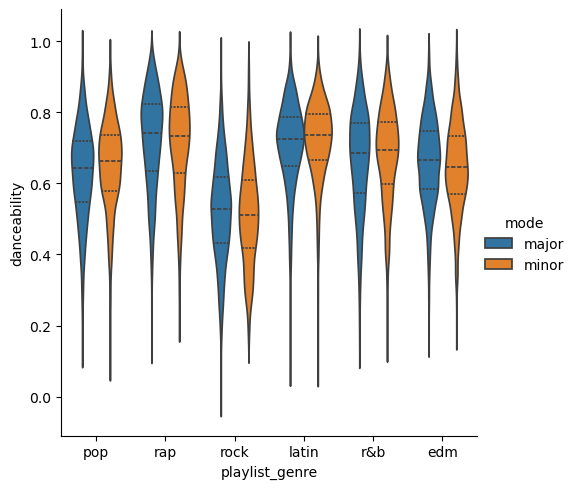

In [49]:
sns.catplot(data=spotify_copy, x='playlist_genre', y='danceability', hue='mode',
            kind='violin', inner='quartile')

plt.show()

The violin plot of `dancability` grouped by `playlist_genre` and `mode` demonstrates how the rock genre generally has a lower `danceability` score than the other genres.

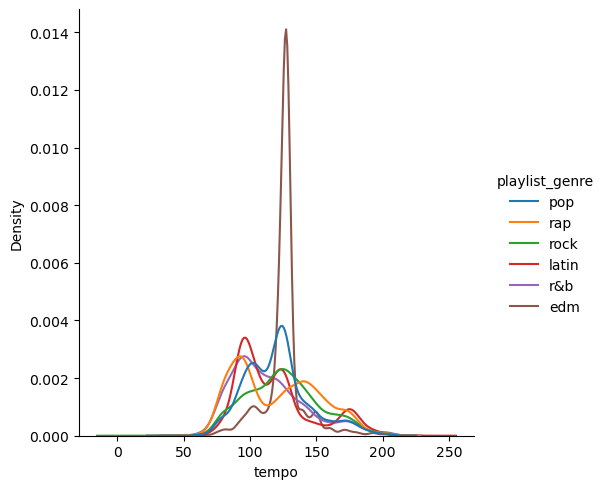

In [50]:
sns.displot(data=spotify_copy, x='tempo', hue='playlist_genre', kind='kde')

plt.show()

As we can see, the distribution of `tempo` depicts edm having a much lower level of variance than the other genres. The violin plot below further demonstrates this.

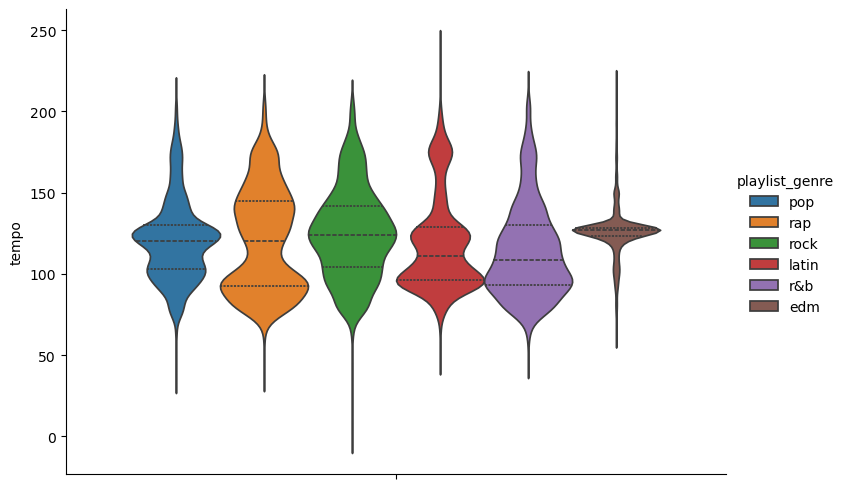

In [51]:
sns.catplot(data=spotify_copy, y='tempo', hue='playlist_genre', aspect=1.5,
            kind='violin', inner='quartile')

plt.show()

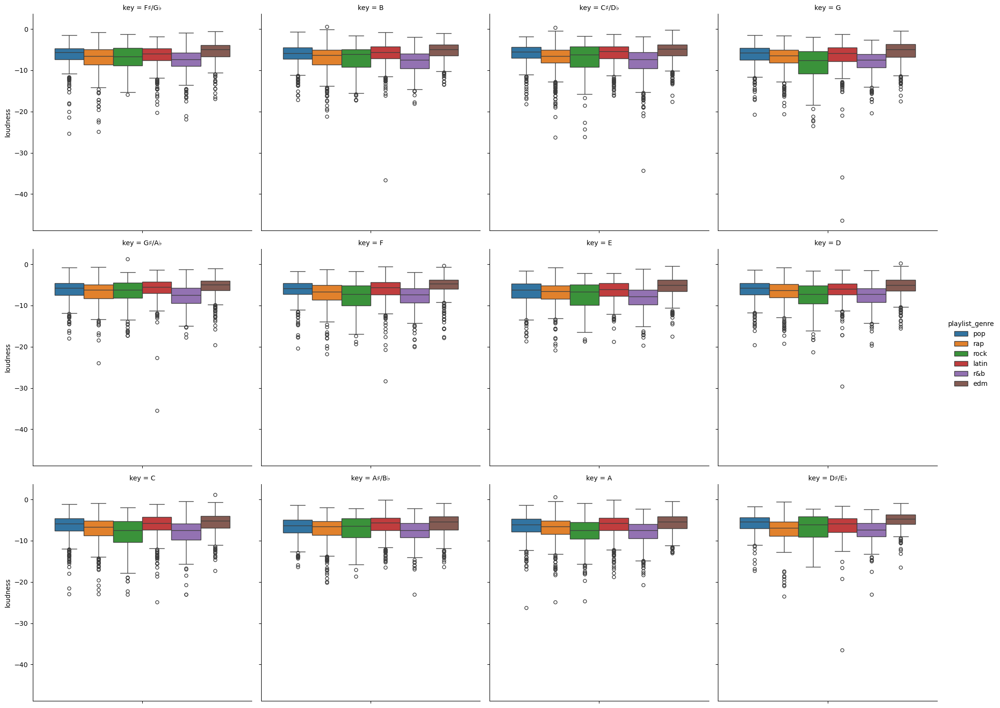

In [52]:
sns.catplot(data=spotify_copy, y='loudness', hue='playlist_genre', col='key', col_wrap=4, kind='box')

plt.show()

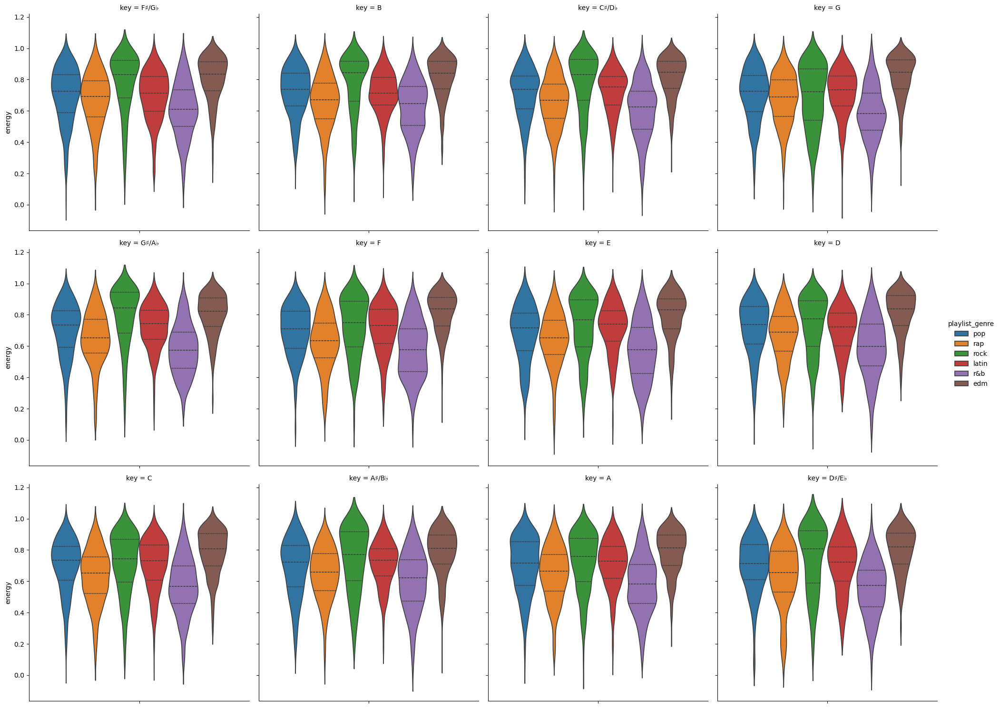

In [53]:
sns.catplot(data=spotify_copy, y='energy', hue='playlist_genre', col='key', col_wrap=4, kind='violin', inner='quartile')

plt.show()

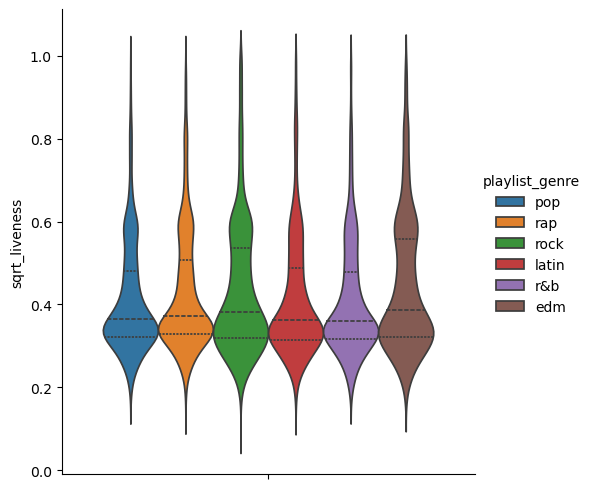

In [54]:
sns.catplot(data=spotify_copy, y='sqrt_liveness', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

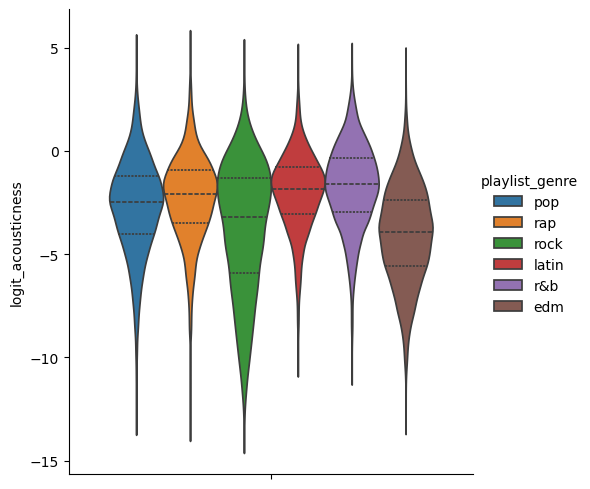

In [55]:
sns.catplot(data=spotify_copy, y='logit_acousticness', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

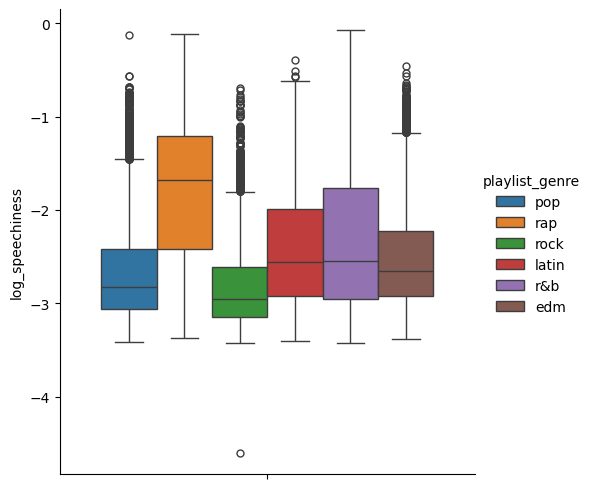

In [56]:
sns.catplot(data=spotify_copy, y='log_speechiness', hue='playlist_genre', kind='box')

plt.show()

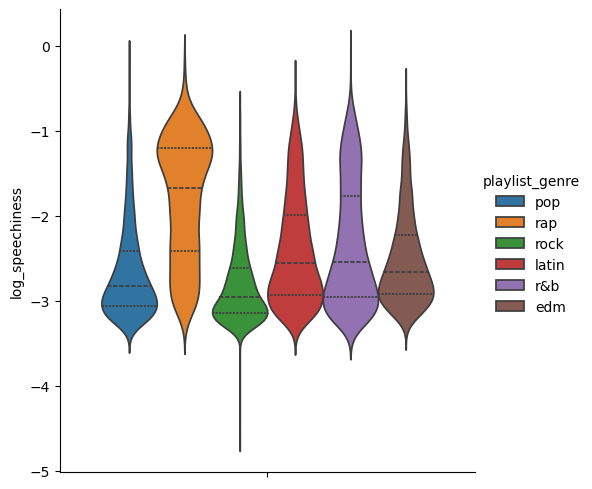

In [57]:
sns.catplot(data=spotify_copy, y='log_speechiness', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

Rap appears have higher levels of `log_speechiness` than the other genres. However the rock genre appears to have a potential outlier on the lower end of `log_speechiness`.

We can see that this outlier has a `track_popularity` score of 0.

In [58]:
spotify_copy.loc[ spotify_copy.playlist_genre == 'rock', ['log_speechiness'] ].sort_values(by='log_speechiness').head(1)

,log_speechiness
11363,-4.60517


The outlier appears to be at `index==11363`. Let's see what happens to the distribution if we remove this outlier.

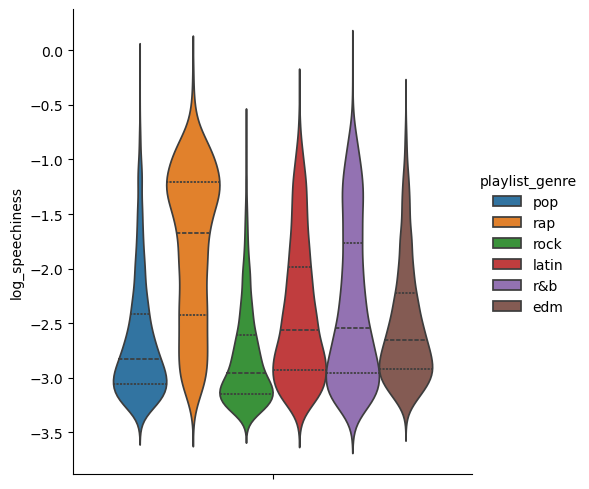

In [59]:
sns.catplot(data=spotify_copy.drop(index=11363), y='log_speechiness', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

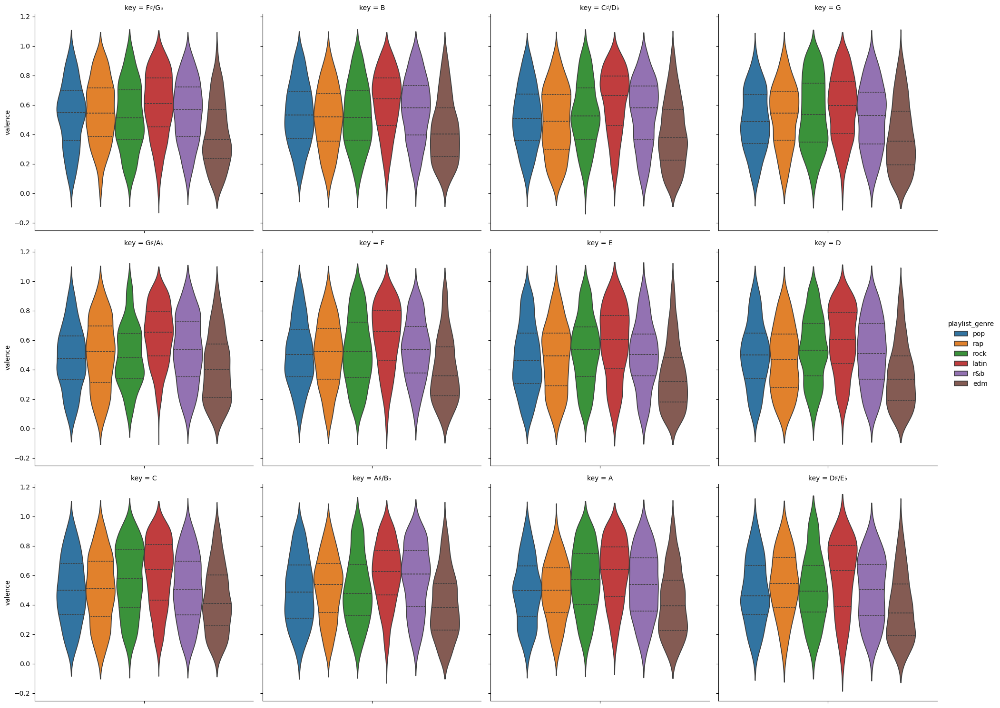

In [60]:
sns.catplot(data=spotify_copy, y='valence', hue='playlist_genre', col='key', col_wrap=4, kind='violin', inner='quartile')

plt.show()

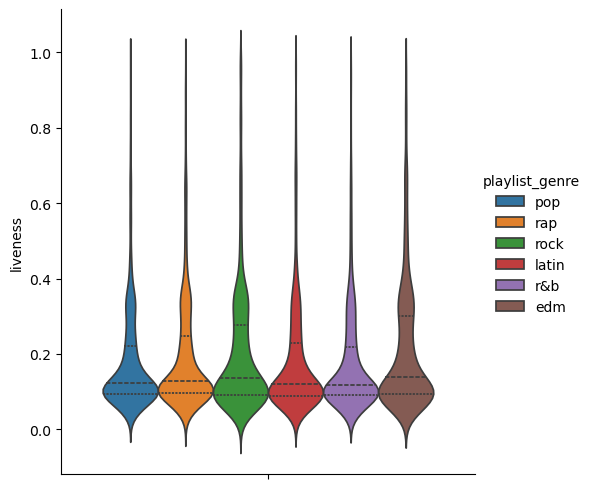

In [61]:
sns.catplot(data=spotify_copy, y='liveness', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

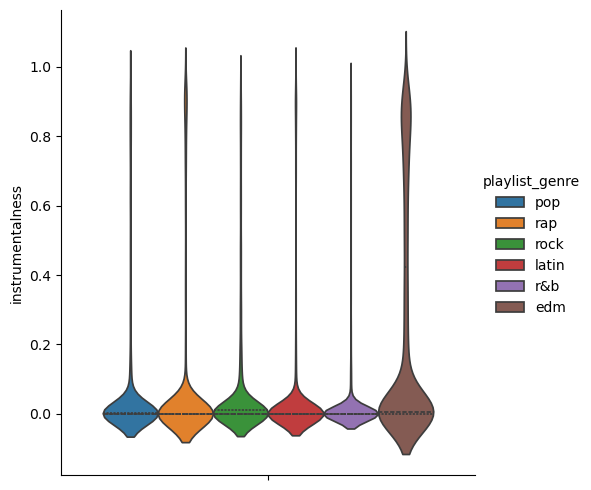

In [62]:
sns.catplot(data=spotify_copy, y='instrumentalness', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

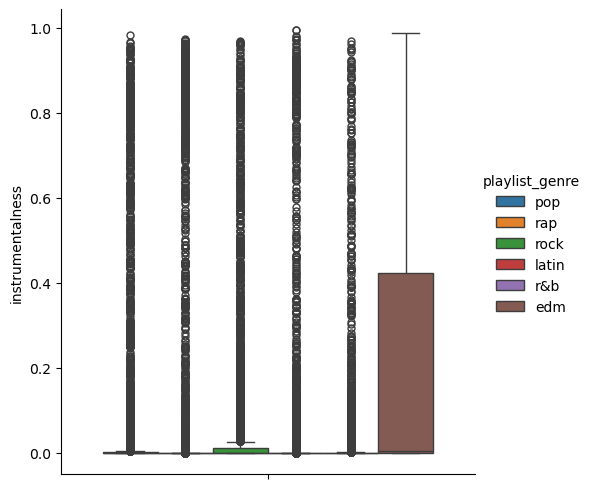

In [63]:
sns.catplot(data=spotify_copy, y='instrumentalness', hue='playlist_genre', kind='box')

plt.show()

The EDM genre tends to have more `instrumentalness` than other genres.

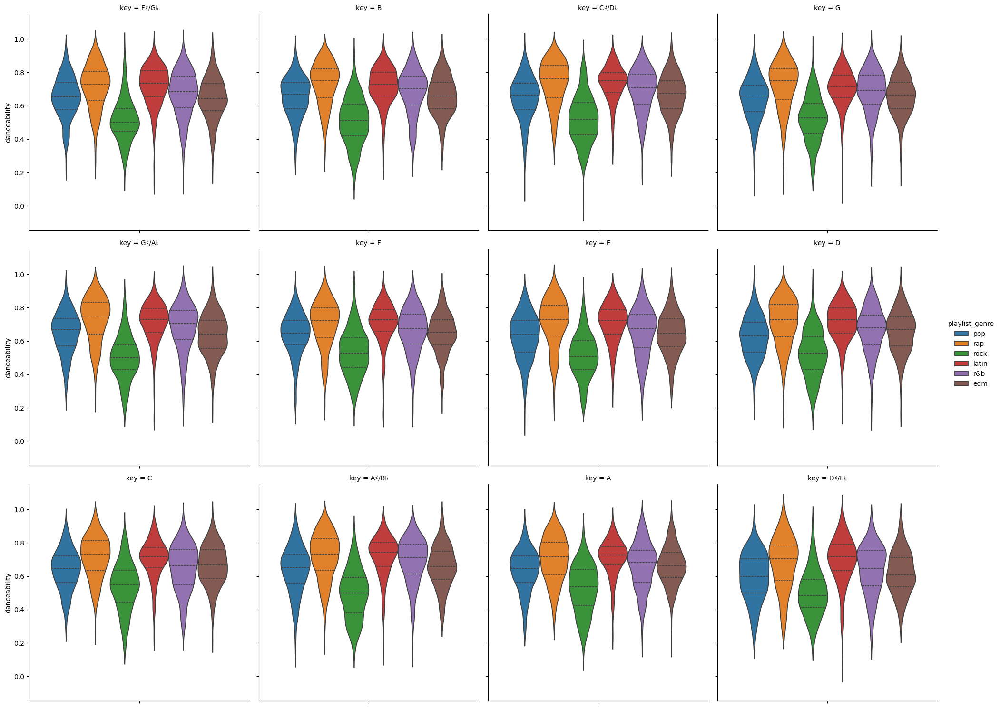

In [64]:
sns.catplot(data=spotify_copy, y='danceability', hue='playlist_genre', col='key', col_wrap=4, kind='violin', inner='quartile')

plt.show()

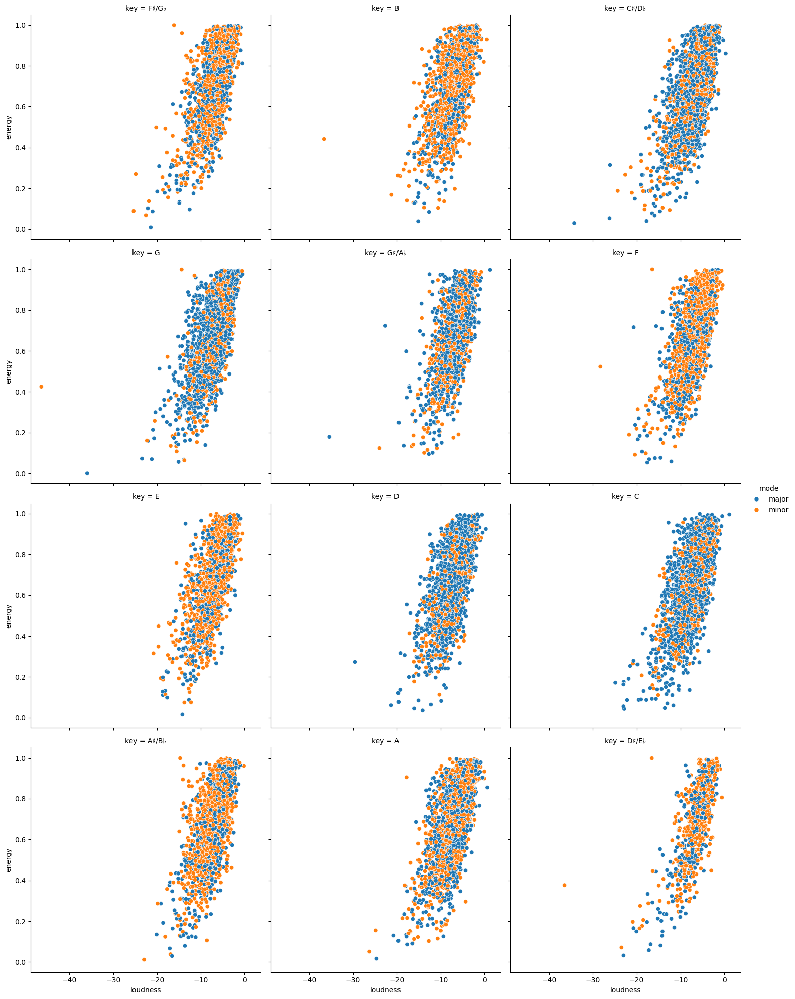

In [65]:
sns.relplot(data=spotify_copy, x='loudness', y='energy', col='key', hue='mode',
            col_wrap=3)

plt.show()

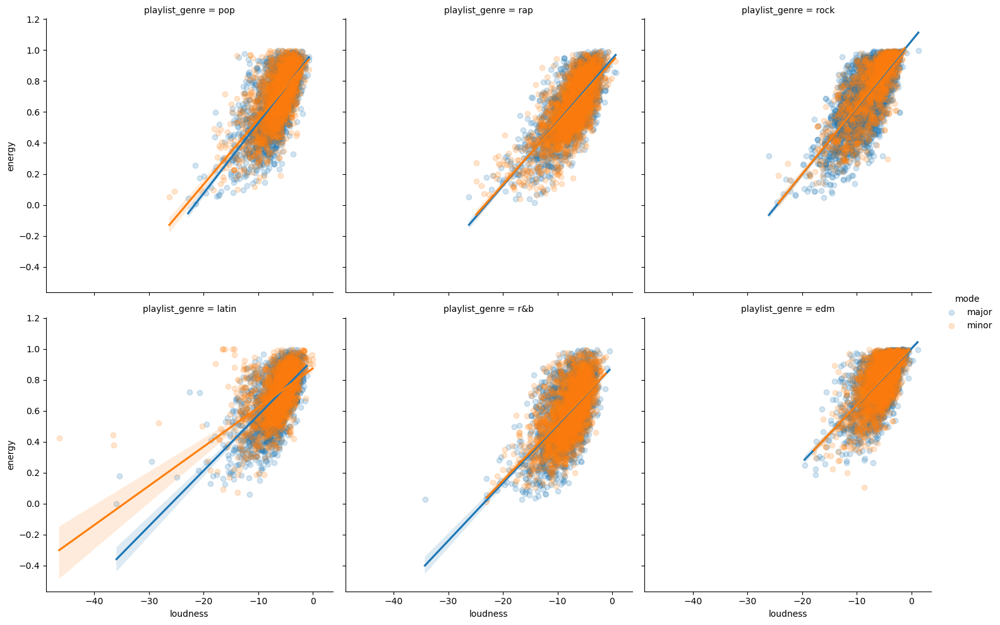

In [66]:
sns.lmplot(data=spotify_copy, x='loudness', y='energy', col='playlist_genre', hue='mode',
           col_wrap=3,
           scatter_kws={'alpha': 0.2})

plt.show()

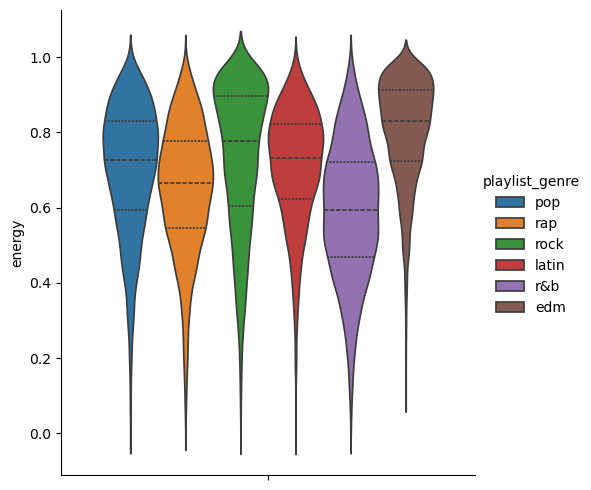

In [67]:
sns.catplot(data=spotify_copy, y='energy', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

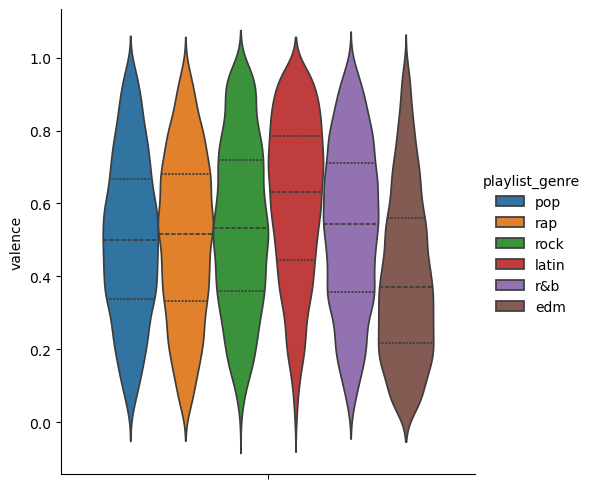

In [68]:
sns.catplot(data=spotify_copy, y='valence', hue='playlist_genre', kind='violin', inner='quartile')

plt.show()

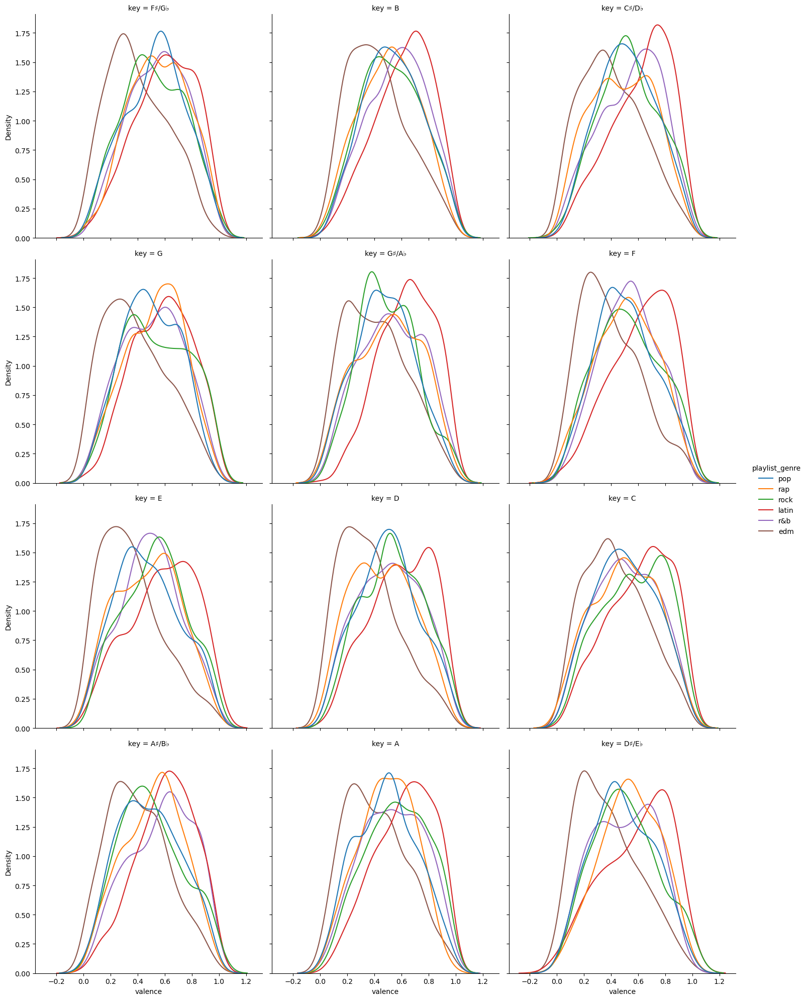

In [69]:
sns.displot(data=spotify_copy, x='valence', col='key', hue='playlist_genre',
            kind='kde',
            common_norm=False,
            col_wrap=3)

plt.show()

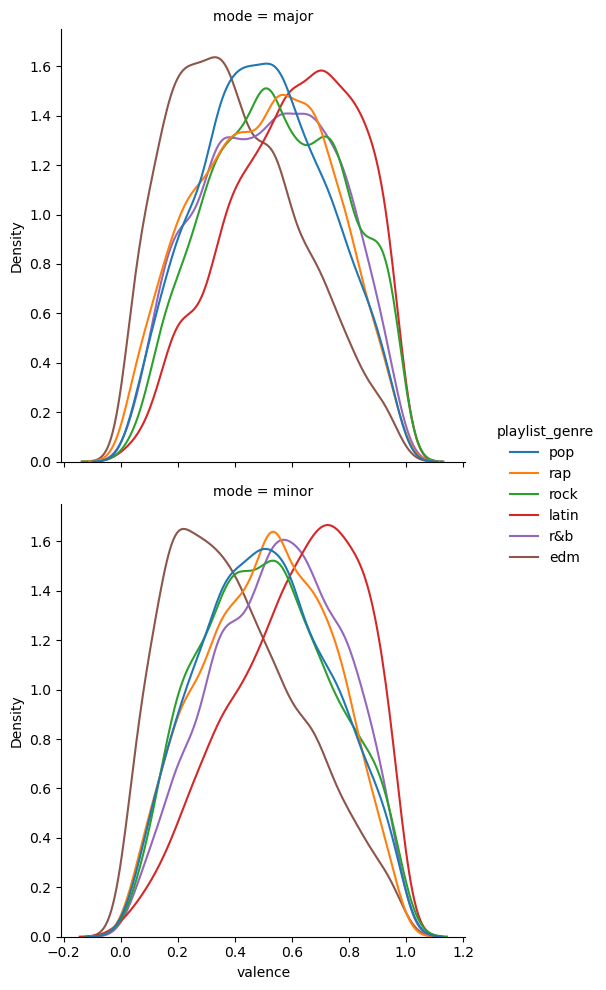

In [70]:
sns.displot(data=spotify_copy, x='valence', row='mode', hue='playlist_genre',
            kind='kde',
            common_norm=False)

plt.show()

In [71]:
spotify_features = spotify_copy.select_dtypes('number')
groups = spotify_copy.playlist_genre.unique().tolist()
genre_corr = spotify_copy.groupby('playlist_genre').corr(numeric_only=True).reset_index()

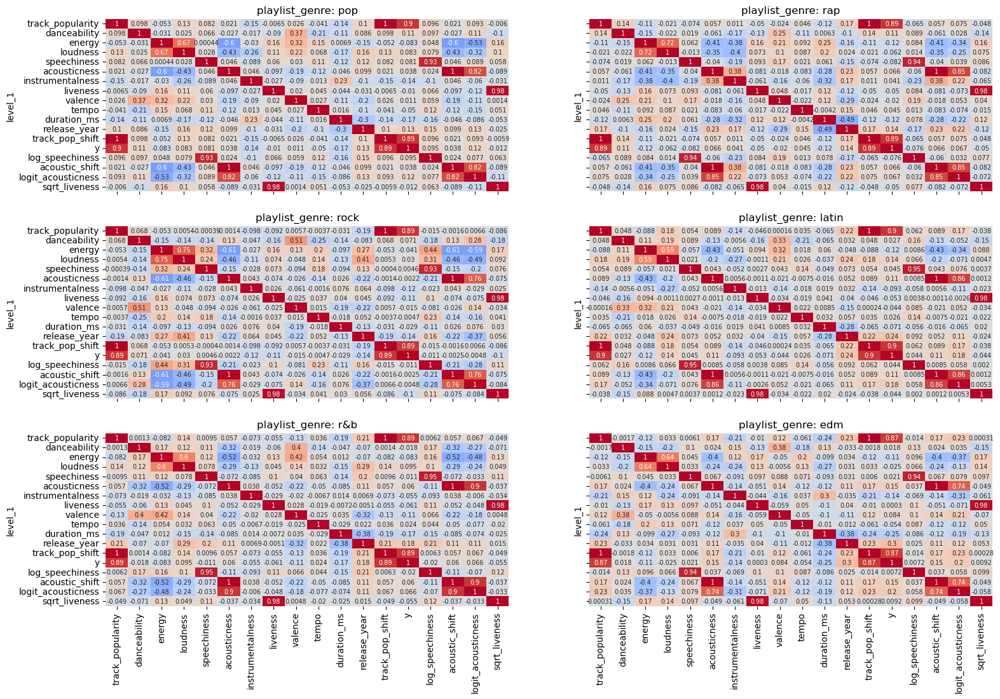

In [72]:
fig, axs = plt.subplots(3, 2, sharex=True, sharey=True, figsize=(18, 12))

cols = spotify_features.columns.tolist()

for ix, genre in enumerate(groups):
    g = genre_corr[genre_corr['playlist_genre'] == genre].set_index('level_1')
    g = g.loc[:, cols]
    ax = axs.flat[ix]
    sns.heatmap(data=g,
                vmin=-1, vmax=1, center=0,
                cmap='coolwarm', cbar=False,
                annot=True, annot_kws={'size': 7},
                ax=ax)
    ax.set_title(f'playlist_genre: {genre}')

plt.show()

## Conclusion

The exploratory data analysis showed that the Spotify dataset is driven largely by continuous audio features rather than categorical labels. Strong relationships emerged among variables such as `energy`, `loudness`, `logit_acousticness`, and `instrumentalness`, while comparisons across genres revealed broad overlap in most audio characteristics. Although certain genres showed tendencies—like higher speechiness in rap or consistent tempo ranges in EDM—these patterns were not statistically significant. Overall, the EDA suggests that the structure in the data comes primarily from continuous acoustic properties, providing a solid foundation for PCA and clustering based on underlying audio features.